In [1]:
import datetime
import geopandas as gpd
import pandas as pd
import numpy as np
from datetime import datetime, timedelta
from stonesoup.feeder.geo import LongLatToUTMConverter
from stonesoup.feeder.time import TimeSyncFeeder
from stonesoup.types.groundtruth import GroundTruthPath, GroundTruthState
from stonesoup.reader.generic import CSVDetectionReader
from stonesoup.models.transition.linear import (
    CombinedLinearGaussianTransitionModel,
    ConstantVelocity,
    OrnsteinUhlenbeck,
)
from stonesoup.plotter import AnimatedPlotterly
from stonesoup.types.detection import Detection
from stonesoup.models.measurement.linear import LinearGaussian
from stonesoup.predictor.kalman import KalmanPredictor
from stonesoup.updater.kalman import KalmanUpdater
from stonesoup.types.state import GaussianState
from stonesoup.types.hypothesis import SingleHypothesis
from stonesoup.types.track import Track

<Axes: >

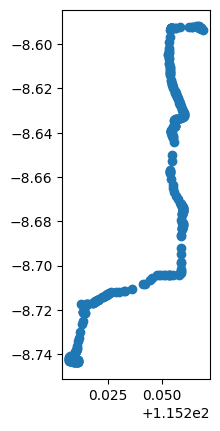

In [2]:
gps_trace = gpd.read_file("./normal_example_1.geojson")
gps_trace.plot()

In [3]:
detector = CSVDetectionReader(
    "./normal_example_1.csv",
    state_vector_fields=("longitude", "latitude"),
    time_field="timestamp"
)

In [4]:
detector = LongLatToUTMConverter(detector)

In [5]:
start_time = pd.to_datetime(gps_trace.loc[0, "timestamp"])

In [6]:
transition_model = CombinedLinearGaussianTransitionModel(
    (OrnsteinUhlenbeck(0.5, 1e-4), OrnsteinUhlenbeck(0.5, 1e-4))
)

In [7]:
measurement_model = LinearGaussian(
    ndim_state=4,
    mapping=[0, 2],
    noise_covar=np.diag([15, 15])
)

In [8]:
predictor = KalmanPredictor(transition_model)
updater = KalmanUpdater(measurement_model)

In [20]:
measurements = []
for detection in detector.detections_gen():
    measurements.append(
        Detection(
            list(detection[1])[0].state_vector,
            timestamp=detection[0],
            measurement_model=measurement_model
        )
    )

In [21]:
prior = GaussianState([[303256.84630219], [1], [9033113.68750062], [1]], np.diag([1, 1, 1, 1]), timestamp=start_time)

In [22]:
track = Track()
timesteps = []
for measurement in measurements:
    timesteps.append(measurement.timestamp)
    prediction = predictor.predict(prior, timestamp=measurement.timestamp)
    hypothesis = SingleHypothesis(prediction, measurement)  # Group a prediction and measurement
    post = updater.update(hypothesis)
    track.append(post)
    prior = track[-1]

/Users/tom.haynes/projects/Stone-Soup/venv/lib/python3.9/site-packages/stonesoup/plotter.py:2345: UserWarning:

Timesteps are not equally spaced, so the passage of time is not linear



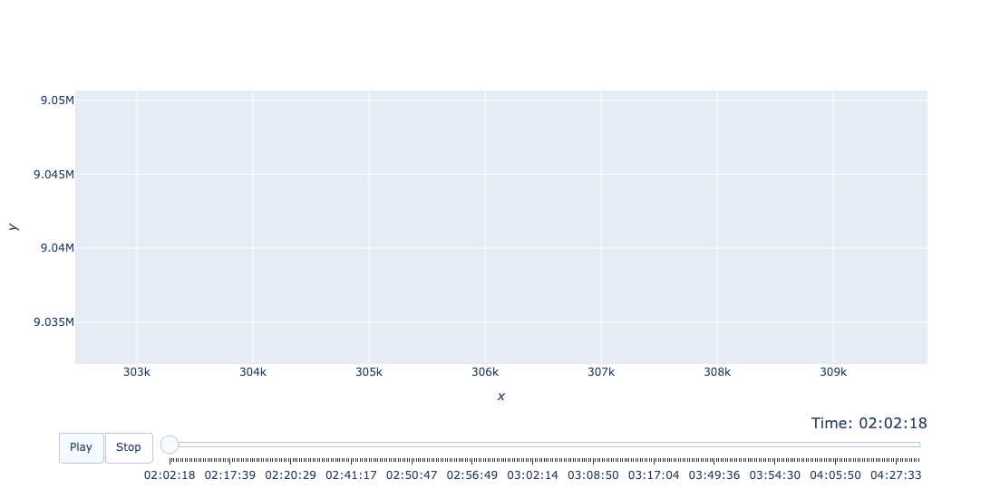

In [23]:
plotter = AnimatedPlotterly(timesteps)
plotter.plot_measurements(measurements, [0, 2])
plotter.plot_tracks(track, [0, 2], uncertainty=True)
plotter.fig

In [ ]:
detector.